<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Goal" data-toc-modified-id="Goal-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Goal</a></span></li><li><span><a href="#Var" data-toc-modified-id="Var-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Var</a></span></li><li><span><a href="#Init" data-toc-modified-id="Init-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Init</a></span></li><li><span><a href="#Load" data-toc-modified-id="Load-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Load</a></span><ul class="toc-item"><li><span><a href="#formatting" data-toc-modified-id="formatting-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>formatting</a></span></li></ul></li><li><span><a href="#asr" data-toc-modified-id="asr-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>asr</a></span><ul class="toc-item"><li><span><a href="#Plotting" data-toc-modified-id="Plotting-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Plotting</a></span><ul class="toc-item"><li><span><a href="#Root-node-CI" data-toc-modified-id="Root-node-CI-5.1.1"><span class="toc-item-num">5.1.1&nbsp;&nbsp;</span>Root node CI</a></span></li></ul></li><li><span><a href="#Mammal-LCA-node" data-toc-modified-id="Mammal-LCA-node-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>Mammal LCA node</a></span><ul class="toc-item"><li><span><a href="#Abundances-on-tree" data-toc-modified-id="Abundances-on-tree-5.2.1"><span class="toc-item-num">5.2.1&nbsp;&nbsp;</span>Abundances on tree</a></span></li></ul></li></ul></li><li><span><a href="#Phylogenetic-signal" data-toc-modified-id="Phylogenetic-signal-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Phylogenetic signal</a></span><ul class="toc-item"><li><span><a href="#Per-trait" data-toc-modified-id="Per-trait-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>Per trait</a></span></li></ul></li><li><span><a href="#sessionInfo" data-toc-modified-id="sessionInfo-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>sessionInfo</a></span></li></ul></div>

# Goal

* use r-phylopars for ancestral state reconstruction of major archaeal clades


# Var

In [1]:
# workdir
work_dir = '/ebio/abt3_projects/Georg_animal_feces/data/16S_arch/MiSeq-Runs-116-122-126-189-190/LLA/ancestral_state/methanogen/'

# microbiome
## 16S-arch phyloseq object (one sample per individual)
physeq_arch_IndD_file = '/ebio/abt3_projects/Georg_animal_feces/data/16S_arch/MiSeq-Runs-116-122-126-189-190/LLA/merged/phyloseq/physeq_arch_IndD_rare250.RDS'

# host tree
host_tree_SpecD_file = '/ebio/abt3_projects/Georg_animal_feces/data/animal/phylogeny/TT/unified_metadata_complete_200429_16S-arch.nwk'

# misc params
threads = 8
my_seed = 8394

# Init

In [2]:
library(dplyr)
library(tidyr)
library(ggplot2)

library(ape)
library(phytools)
library(Rphylopars)
library(phyloseq)

library(doParallel)
library(LeyLabRMisc)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: maps

Loading required package: foreach

Loading required package: iterators

Loading required package: parallel



In [3]:
df.dims()
set.seed(my_seed)
make_dir(work_dir)
RhpcBLASctl::blas_set_num_threads(1)

Directory already exists: /ebio/abt3_projects/Georg_animal_feces/data/16S_arch/MiSeq-Runs-116-122-126-189-190/LLA/ancestral_state/methanogen/ 


# Load

In [4]:
# phyloseq obj.
physeq = readRDS(physeq_arch_IndD_file)
physeq

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 1345 taxa and 185 samples ]
sample_data() Sample Data:       [ 185 samples by 88 sample variables ]
tax_table()   Taxonomy Table:    [ 1345 taxa by 7 taxonomic ranks ]
phy_tree()    Phylogenetic Tree: [ 1345 tips and 1342 internal nodes ]

In [5]:
# metadata
meta = physeq %>%
    phyloseq2df(sample_data) %>%
    dplyr::select(SampleID, class, order, family, genus, scientific_name,
                  diet, digestive_system, habitat)
meta

SampleID,class,order,family,genus,scientific_name,diet,digestive_system,habitat
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
F14_Common_Bream,Actinopterygii,Cypriniformes,Cyprinidae,Abramis,Abramis_brama,omnivore,simple,aquatic habitat
F35_Red_Deer,Mammalia,Artiodactyla,Cervidae,Cervus,Cervus_elaphus,herbivore,foregut,terrestrial habitat
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮
X431_Quagga,Mammalia,Perissodactyla,Equidae,Equus,Equus_quagga,herbivore,hindgut,terrestrial habitat
X67_European_Roe,Mammalia,Artiodactyla,Cervidae,Capreolus,Capreolus_capreolus,herbivore,foregut,terrestrial habitat


In [6]:
# host tree
host_tree_SpecD = read.tree(host_tree_SpecD_file)
host_tree_SpecD


Phylogenetic tree with 110 tips and 109 internal nodes.

Tip labels:
	Leuciscus_cephalus, Rutilus_rutilus, Leuciscus_idus, Blicca_bjoerkna, Abramis_brama, Cyprinus_carpio, ...
Node labels:
	, @_20_@, @_17_@, @_14_@, @_9_@, @_15_@, ...

Rooted; includes branch lengths.

## formatting

In [7]:
# aggregating
physeq = tax_glom(physeq, taxrank='Genus')
physeq

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 81 taxa and 185 samples ]
sample_data() Sample Data:       [ 185 samples by 88 sample variables ]
tax_table()   Taxonomy Table:    [ 81 taxa by 7 taxonomic ranks ]
phy_tree()    Phylogenetic Tree: [ 81 tips and 80 internal nodes ]

In [8]:
# filter by sparsity
physeq = physeq %>%
    filter_taxa(function(x) sum(x > 0) >= 3, TRUE) %>%
    prune_samples(sample_sums(.) > 0, .)
physeq

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 41 taxa and 185 samples ]
sample_data() Sample Data:       [ 185 samples by 88 sample variables ]
tax_table()   Taxonomy Table:    [ 41 taxa by 7 taxonomic ranks ]
phy_tree()    Phylogenetic Tree: [ 41 tips and 40 internal nodes ]

In [9]:
# trait table
otu = physeq %>%
    phyloseq2df(otu_table, long=TRUE) %>%
    inner_join(physeq %>% phyloseq2df(tax_table),
               c('OTU')) %>%
    inner_join(meta, c('Sample'='SampleID')) %>%
    filter(scientific_name %in% host_tree_SpecD$tip.label) %>%
    mutate(Taxonomy = paste(Phylum, Class, Order, Family, Genus, sep='-')) %>%
    group_by(Sample, scientific_name, Taxonomy) %>%
    summarize(Abundance = sum(Count, na.rm=TRUE), .groups='drop') %>%
    spread(Taxonomy, Abundance) %>%
    rename('species' = scientific_name) %>%
    as.data.frame

rownames(otu) = otu$Sample
otu$Sample = NULL
otu

,species,Crenarchaeota-Bathyarchaeia-unclassified-unclassified-unclassified,Crenarchaeota-Bathyarchaeia-uncultured euryarchaeote-uncultured euryarchaeote-uncultured euryarchaeote,Crenarchaeota-Bathyarchaeia-unidentified archaeon-unidentified archaeon-unidentified archaeon,Euryarchaeota-Halobacteria-Halobacteriales-Halococcaceae-uncultured,Euryarchaeota-Halobacteria-Halobacteriales-Haloferacaceae-Halohasta,Euryarchaeota-Halobacteria-Halobacteriales-Haloferacaceae-Haloterrigena,Euryarchaeota-Halobacteria-Halobacteriales-Haloferacaceae-Natronococcus,Euryarchaeota-Halobacteria-Halobacteriales-Haloferacaceae-Natronorubrum,Euryarchaeota-Halobacteria-Halobacteriales-Haloferacaceae-unclassified,⋯,Nanoarchaeaeota-Woesearchaeia-unclassified-unclassified-unclassified,Thaumarchaeota-Nitrososphaeria-Nitrosopumilales-Nitrosopumilaceae-Candidatus Nitrosoarchaeum,Thaumarchaeota-Nitrososphaeria-Nitrososphaerales-Nitrososphaeraceae-Candidatus Nitrocosmicus,Thaumarchaeota-Nitrososphaeria-Nitrososphaerales-Nitrososphaeraceae-Candidatus Nitrososphaera,Thaumarchaeota-Nitrososphaeria-Nitrososphaerales-Nitrososphaeraceae-metagenome,Thaumarchaeota-Nitrososphaeria-Nitrososphaerales-Nitrososphaeraceae-unclassified,Thaumarchaeota-Nitrososphaeria-Nitrososphaerales-Nitrososphaeraceae-uncultured thaumarchaeote,Thaumarchaeota-Nitrososphaeria-Nitrososphaerales-Nitrososphaeraceae-unidentified archaeon,Thaumarchaeota-Nitrososphaeria-Nitrososphaerales-Nitrososphaeraceae-unidentified archaeon SCA1150,Thaumarchaeota-Nitrososphaeria-Nitrososphaerales-Nitrososphaeraceae-unidentified archaeon SCA1154
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
F14_Common_Bream,Abramis_brama,0.8,0.4,0,0,0,0,0,0,0,⋯,0,0,0.0,0.0,0,0.0,0,0.0,0.0,0
F157a_European_Toad,Bufo_bufo,0.0,0.0,0,0,0,0,0,0,0,⋯,0,0,2.8,0.4,0,11.2,0,0.8,3.6,0
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋱,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮
X95_Meadow_Viper,Vipera_ursinii,0,0,0,0,0,0,0,0,0,⋯,0,0,0,16.8,0,29.6,10,30,10.4,0
X96_European_Hare,Lepus_europaeus,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0.0,0,0.0,0,0,0.0,0


In [10]:
# checking table
otu[,2:ncol(otu)] %>% rowSums %>% summary
otu[,2:ncol(otu)] %>% colSums %>% summary

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  45.60  100.00  100.00   99.46  100.00  100.00 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    3.6    11.2    48.0   448.8   164.0  7381.6 

In [11]:
# filtering
x = otu[,2:ncol(otu)] %>% colSums
otu = otu[,c('species', names(x[x >= 50]))]
otu

,species,Euryarchaeota-Halobacteria-Halobacteriales-Halococcaceae-uncultured,Euryarchaeota-Halobacteria-Halobacteriales-Haloferacaceae-unclassified,Euryarchaeota-Methanobacteria-Methanobacteriales-Methanobacteriaceae-Methanobacterium,Euryarchaeota-Methanobacteria-Methanobacteriales-Methanobacteriaceae-Methanobrevibacter,Euryarchaeota-Methanobacteria-Methanobacteriales-Methanobacteriaceae-Methanosphaera,Euryarchaeota-Methanobacteria-Methanobacteriales-Methanobacteriaceae-unclassified,Euryarchaeota-Methanobacteria-Methanobacteriales-Methanothermobacteraceae-Methanothermobacter,Euryarchaeota-Methanomicrobia-Methanomicrobiales-Methanocorpusculaceae-Methanocorpusculum,Euryarchaeota-Methanomicrobia-Methanosarcinales-Methanosarcinaceae-Methanimicrococcus,Euryarchaeota-Methanomicrobia-Methanosarcinales-Methanosarcinaceae-Methanosarcina,Euryarchaeota-Methanomicrobia-unclassified-unclassified-unclassified,Euryarchaeota-Thermoplasmata-Methanomassiliicoccales-Methanomethylophilaceae-Candidatus Methanogranum,Euryarchaeota-Thermoplasmata-Methanomassiliicoccales-Methanomethylophilaceae-Candidatus Methanomethylophilus,Euryarchaeota-Thermoplasmata-Methanomassiliicoccales-Methanomethylophilaceae-unclassified,Euryarchaeota-Thermoplasmata-Methanomassiliicoccales-Methanomethylophilaceae-uncultured,Thaumarchaeota-Nitrososphaeria-Nitrososphaerales-Nitrososphaeraceae-Candidatus Nitrocosmicus,Thaumarchaeota-Nitrososphaeria-Nitrososphaerales-Nitrososphaeraceae-Candidatus Nitrososphaera,Thaumarchaeota-Nitrososphaeria-Nitrososphaerales-Nitrososphaeraceae-unclassified,Thaumarchaeota-Nitrososphaeria-Nitrososphaerales-Nitrososphaeraceae-unidentified archaeon
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
F14_Common_Bream,Abramis_brama,0,0,73.6,0.8,0,0,0,2.4,0,1.2,16,0,0,0,0,0.0,0.0,0.0,0.0
F157a_European_Toad,Bufo_bufo,0,0,0.0,81.2,0,0,0,0.0,0,0.0,0,0,0,0,0,2.8,0.4,11.2,0.8
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮
X95_Meadow_Viper,Vipera_ursinii,0,0,0,0.0,0,0,0.0,2.4,0,0,0,0,0.8,0,0,0,16.8,29.6,30
X96_European_Hare,Lepus_europaeus,0,0,0,19.6,80,0,0.4,0.0,0,0,0,0,0.0,0,0,0,0.0,0.0,0


In [12]:
# checking overlap
overlap(host_tree_SpecD$tip.label, otu$species)

intersect(x,y): 110 
setdiff(x,y): 0 
setdiff(y,x): 0 
union(x,y): 110 


# asr

In [13]:
# running
p_BM = phylopars(trait_data = otu,
                 tree = host_tree_SpecD)
p_BM %>% names

[1] "logLik"     "pars"       "model"      "mu"         "npars"     
 [6] "anc_recon"  "anc_var"    "anc_cov"    "tree"       "trait_data"
[11] "REML"

In [14]:
# confidence intervals
p_BM_CIL = p_BM$anc_recon - sqrt(p_BM$anc_var)*1.96 # Lower 95% CI
p_BM_CIU = p_BM$anc_recon + sqrt(p_BM$anc_var)*1.96 # Upper 95% CI

In [15]:
# ancestral state reconstruction values
asr = p_BM$anc_recon %>% apply(2, scales::rescale) %>%
    as.data.frame
asr

,Euryarchaeota-Halobacteria-Halobacteriales-Halococcaceae-uncultured,Euryarchaeota-Halobacteria-Halobacteriales-Haloferacaceae-unclassified,Euryarchaeota-Methanobacteria-Methanobacteriales-Methanobacteriaceae-Methanobacterium,Euryarchaeota-Methanobacteria-Methanobacteriales-Methanobacteriaceae-Methanobrevibacter,Euryarchaeota-Methanobacteria-Methanobacteriales-Methanobacteriaceae-Methanosphaera,Euryarchaeota-Methanobacteria-Methanobacteriales-Methanobacteriaceae-unclassified,Euryarchaeota-Methanobacteria-Methanobacteriales-Methanothermobacteraceae-Methanothermobacter,Euryarchaeota-Methanomicrobia-Methanomicrobiales-Methanocorpusculaceae-Methanocorpusculum,Euryarchaeota-Methanomicrobia-Methanosarcinales-Methanosarcinaceae-Methanimicrococcus,Euryarchaeota-Methanomicrobia-Methanosarcinales-Methanosarcinaceae-Methanosarcina,Euryarchaeota-Methanomicrobia-unclassified-unclassified-unclassified,Euryarchaeota-Thermoplasmata-Methanomassiliicoccales-Methanomethylophilaceae-Candidatus Methanogranum,Euryarchaeota-Thermoplasmata-Methanomassiliicoccales-Methanomethylophilaceae-Candidatus Methanomethylophilus,Euryarchaeota-Thermoplasmata-Methanomassiliicoccales-Methanomethylophilaceae-unclassified,Euryarchaeota-Thermoplasmata-Methanomassiliicoccales-Methanomethylophilaceae-uncultured,Thaumarchaeota-Nitrososphaeria-Nitrososphaerales-Nitrososphaeraceae-Candidatus Nitrocosmicus,Thaumarchaeota-Nitrososphaeria-Nitrososphaerales-Nitrososphaeraceae-Candidatus Nitrososphaera,Thaumarchaeota-Nitrososphaeria-Nitrososphaerales-Nitrososphaeraceae-unclassified,Thaumarchaeota-Nitrososphaeria-Nitrososphaerales-Nitrososphaeraceae-unidentified archaeon
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Leuciscus_cephalus,0.06607876,0.06960377,0.10244917,0.3802753,0.2097567,0.5180108,0.6267988,0.03430176,0.02367645,0.7356952,0.1286877,0.002683187,0.08034620,0.01714571,0.09881017,0.07873348,0.03475411,0.2053113,0.06163268
Rutilus_rutilus,0.02450348,0.02986460,0.02024247,0.3963424,0.1752995,0.5816872,0.5161127,0.06076204,0.03851304,0.8404469,0.0000000,0.004422108,0.09735933,0.01424514,0.12277707,0.07798704,0.02556063,0.3523959,0.18920146
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮
218,0.07538806,0.09614847,0.01355315,0.7692651,0.3136808,0.6346699,0.2740470,0.4852761,0.4128384,0.09905594,0.07309894,0.06057520,0.1466289,0.05591207,0.2236241,0.03491150,0.02807444,0.08311826,0.03110436
219,0.07296330,0.09202382,0.01149889,0.8201737,0.3223554,0.6585109,0.2070459,0.5509410,0.5737107,0.08325482,0.07209294,0.09059925,0.1587630,0.04786281,0.2134928,0.03010839,0.02220656,0.07124854,0.02511677


## Plotting

In [16]:
# re-labeling tree internal nodes
n_tips = length(host_tree_SpecD$tip.label)
tree = reorder(host_tree_SpecD, "postorder")
tree$node.label = (1+n_tips):(n_tips + length(host_tree_SpecD$node.label))
tree$node.label

[1] 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128
 [19] 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146
 [37] 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164
 [55] 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182
 [73] 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200
 [91] 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218
[109] 219

### Root node CI

In [31]:
# root node CI
lca = '111'
root_node_asr_CI = rbind(p_BM$anc_recon[lca,], p_BM_CIL[lca,], p_BM_CIU[lca,]) %>% 
    t %>% as.data.frame
colnames(root_node_asr_CI) = c('ASR', 'CIL', 'CIU')
root_node_asr_CI$Taxonomy = rownames(root_node_asr_CI)

df.dims(10)
root_node_asr_CI
df.dims()

,ASR,CIL,CIU,Taxonomy
,<dbl>,<dbl>,<dbl>,<chr>
Euryarchaeota-Halobacteria-Halobacteriales-Halococcaceae-uncultured,0.3080696,-0.1686441,0.7847834,Euryarchaeota-Halobacteria-Halobacteriales-Halococcaceae-uncultured
Euryarchaeota-Halobacteria-Halobacteriales-Haloferacaceae-unclassified,1.7657171,-1.6628379,5.1942721,Euryarchaeota-Halobacteria-Halobacteriales-Haloferacaceae-unclassified
Euryarchaeota-Methanobacteria-Methanobacteriales-Methanobacteriaceae-Methanobacterium,5.9723754,-22.0834963,34.0282472,Euryarchaeota-Methanobacteria-Methanobacteriales-Methanobacteriaceae-Methanobacterium
Euryarchaeota-Methanobacteria-Methanobacteriales-Methanobacteriaceae-Methanobrevibacter,28.9794723,-34.6198010,92.5787455,Euryarchaeota-Methanobacteria-Methanobacteriales-Methanobacteriaceae-Methanobrevibacter
Euryarchaeota-Methanobacteria-Methanobacteriales-Methanobacteriaceae-Methanosphaera,5.0946267,-12.9976679,23.1869212,Euryarchaeota-Methanobacteria-Methanobacteriales-Methanobacteriaceae-Methanosphaera
⋮,⋮,⋮,⋮,⋮
Euryarchaeota-Thermoplasmata-Methanomassiliicoccales-Methanomethylophilaceae-uncultured,1.722811,-20.27205,23.71768,Euryarchaeota-Thermoplasmata-Methanomassiliicoccales-Methanomethylophilaceae-uncultured
Thaumarchaeota-Nitrososphaeria-Nitrososphaerales-Nitrososphaeraceae-Candidatus Nitrocosmicus,3.275182,-17.35031,23.90067,Thaumarchaeota-Nitrososphaeria-Nitrososphaerales-Nitrososphaeraceae-Candidatus Nitrocosmicus
Thaumarchaeota-Nitrososphaeria-Nitrososphaerales-Nitrososphaeraceae-Candidatus Nitrososphaera,1.696403,-16.48103,19.87383,Thaumarchaeota-Nitrososphaeria-Nitrososphaerales-Nitrososphaeraceae-Candidatus Nitrososphaera


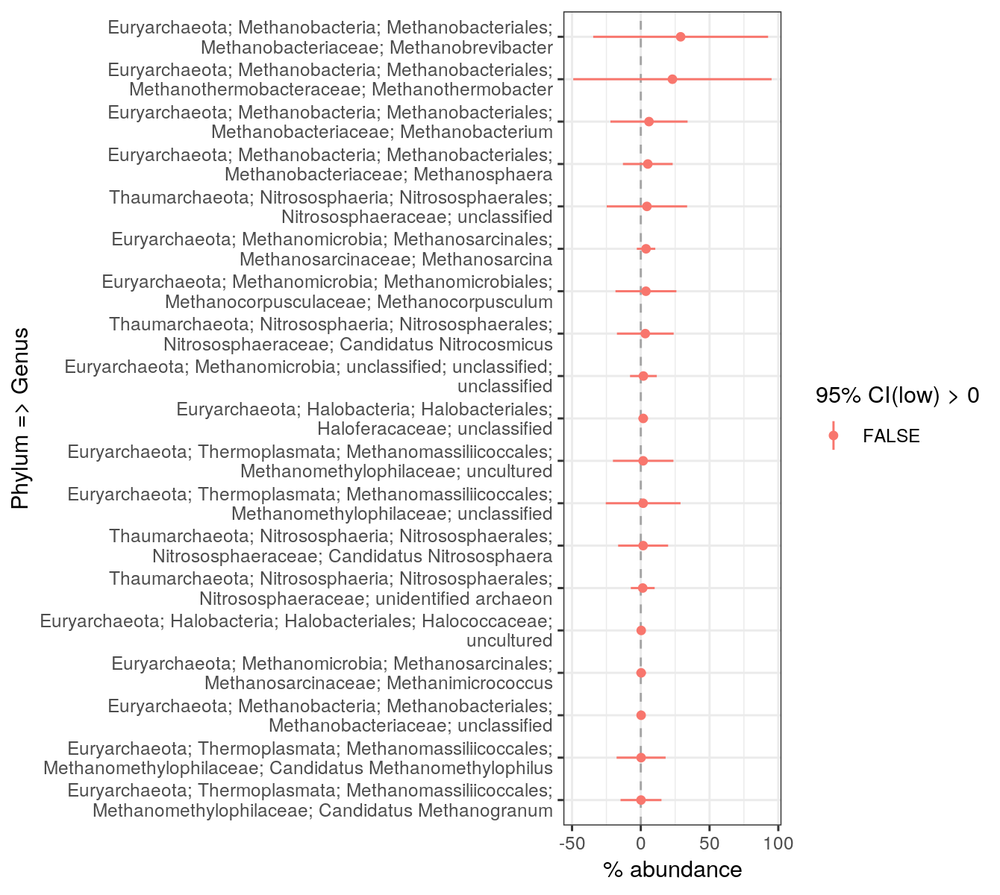

In [33]:
# plotting
p = root_node_asr_CI %>%
    mutate(CIL_gtz = CIL > 0) %>%
    mutate(Taxonomy = gsub('-', '; ', Taxonomy),
           Taxonomy = stringr::str_wrap(Taxonomy, 60),
           Taxonomy = Taxonomy %>% reorder(ASR)) %>%
    ggplot(aes(x=Taxonomy, y=ASR, ymin=CIL, ymax=CIU, color=CIL_gtz)) +
    geom_hline(yintercept=0, linetype='dashed', alpha=0.3) +
    geom_linerange() +
    geom_point() +
    scale_color_discrete('95% CI(low) > 0') +
    labs(x='Phylum => Genus', y='% abundance') +
    theme_bw() +
    coord_flip()

p.dims(6.7,6)
plot(p)

## Mammal LCA node

In [19]:
mammals = meta %>%
    filter(class == 'Mammalia') %>%
    .$scientific_name %>% unique
mammals %>% length

[1] 71

In [20]:
lca = getMRCA(host_tree_SpecD, mammals) %>% as.character
lca

[1] "150"

In [21]:
# root node CI
root_node_asr_CI = rbind(p_BM$anc_recon[lca,], p_BM_CIL[lca,], p_BM_CIU[lca,]) %>% 
    t %>% as.data.frame
colnames(root_node_asr_CI) = c('ASR', 'CIL', 'CIU')
root_node_asr_CI$Taxonomy = rownames(root_node_asr_CI)
root_node_asr_CI

,ASR,CIL,CIU,Taxonomy
,<dbl>,<dbl>,<dbl>,<chr>
Euryarchaeota-Halobacteria-Halobacteriales-Halococcaceae-uncultured,0.2509359,-0.09062008,0.5924919,Euryarchaeota-Halobacteria-Halobacteriales-Halococcaceae-uncultured
Euryarchaeota-Halobacteria-Halobacteriales-Haloferacaceae-unclassified,1.4296814,-0.88228375,3.7416465,Euryarchaeota-Halobacteria-Halobacteriales-Haloferacaceae-unclassified
⋮,⋮,⋮,⋮,⋮
Thaumarchaeota-Nitrososphaeria-Nitrososphaerales-Nitrososphaeraceae-unclassified,3.5025677,-13.903451,20.908586,Thaumarchaeota-Nitrososphaeria-Nitrososphaerales-Nitrososphaeraceae-unclassified
Thaumarchaeota-Nitrososphaeria-Nitrososphaerales-Nitrososphaeraceae-unidentified archaeon,0.8447535,-4.311736,6.001243,Thaumarchaeota-Nitrososphaeria-Nitrososphaerales-Nitrososphaeraceae-unidentified archaeon


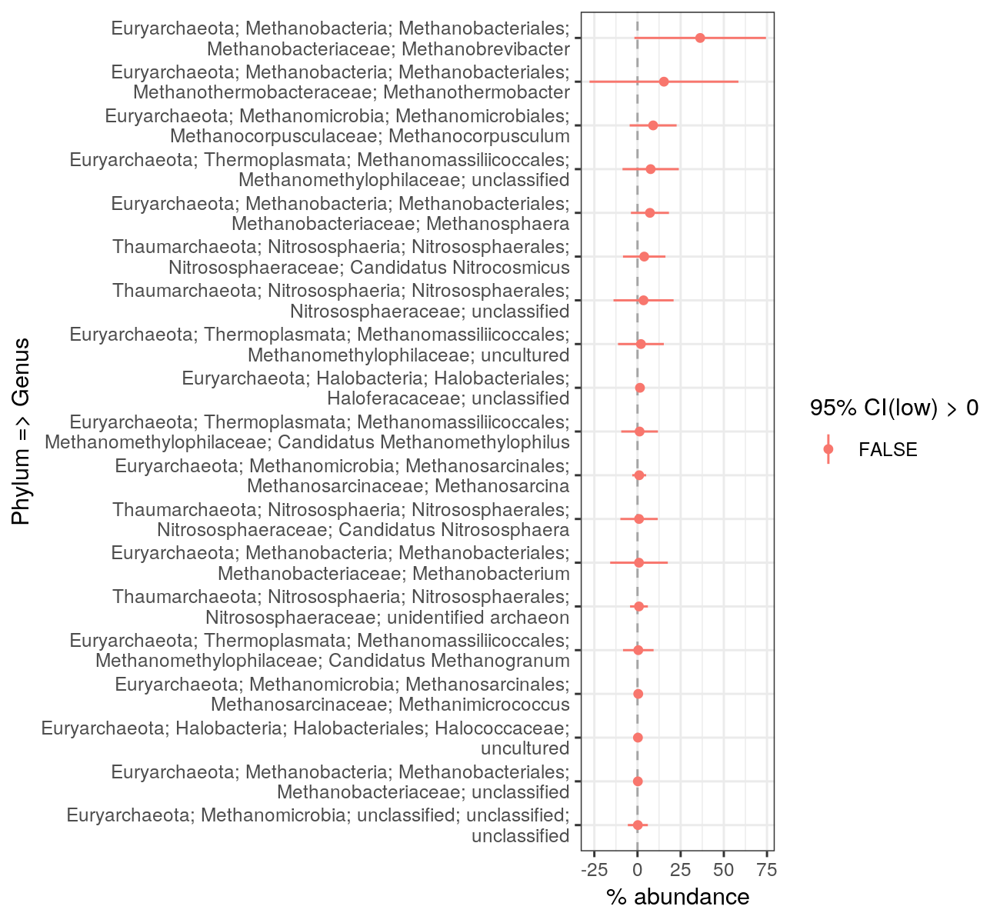

In [28]:
# plotting
p = root_node_asr_CI %>%
    mutate(CIL_gtz = CIL > 0) %>%
    mutate(Taxonomy = gsub('-', '; ', Taxonomy),
           Taxonomy = stringr::str_wrap(Taxonomy, 60),
           Taxonomy = Taxonomy %>% reorder(ASR)) %>%
    ggplot(aes(x=Taxonomy, y=ASR, ymin=CIL, ymax=CIU, color=CIL_gtz)) +
    geom_hline(yintercept=0, linetype='dashed', alpha=0.3) +
    geom_linerange() +
    geom_point() +
    scale_color_discrete('95% CI(low) > 0') +
    labs(x='Phylum => Genus', y='% abundance') +
    theme_bw() +
    coord_flip()

p.dims(6.5,6)
plot(p)

### Abundances on tree

In [29]:
#' function to plot traits on the tree
plot_tree = function(i, tree, taxa, asr){
    title = taxa[i]
    # plotting
    p.dims(6,6.5)
    par(mar=c(0.1, 0.1, 2, 0.1))

    ## tree
    plot(ladderize(tree), type='fan', show.tip.label=TRUE, cex=0.45, 
         label.offset=6)
    title(main=title, cex.main=0.7)
    ## tips
    tip_vals = asr[1:length(tree$tip.label),i]
    tiplabels(pch = 21, cex=(tip_vals))
    ## nodes
    node_vals = asr[(1+n_tips):(n_tips + length(host_tree_SpecD$node.label)*1.5)**1.5,i]
    nodelabels(pch = 21, cex=(node_vals*1.5)**1.5)
}

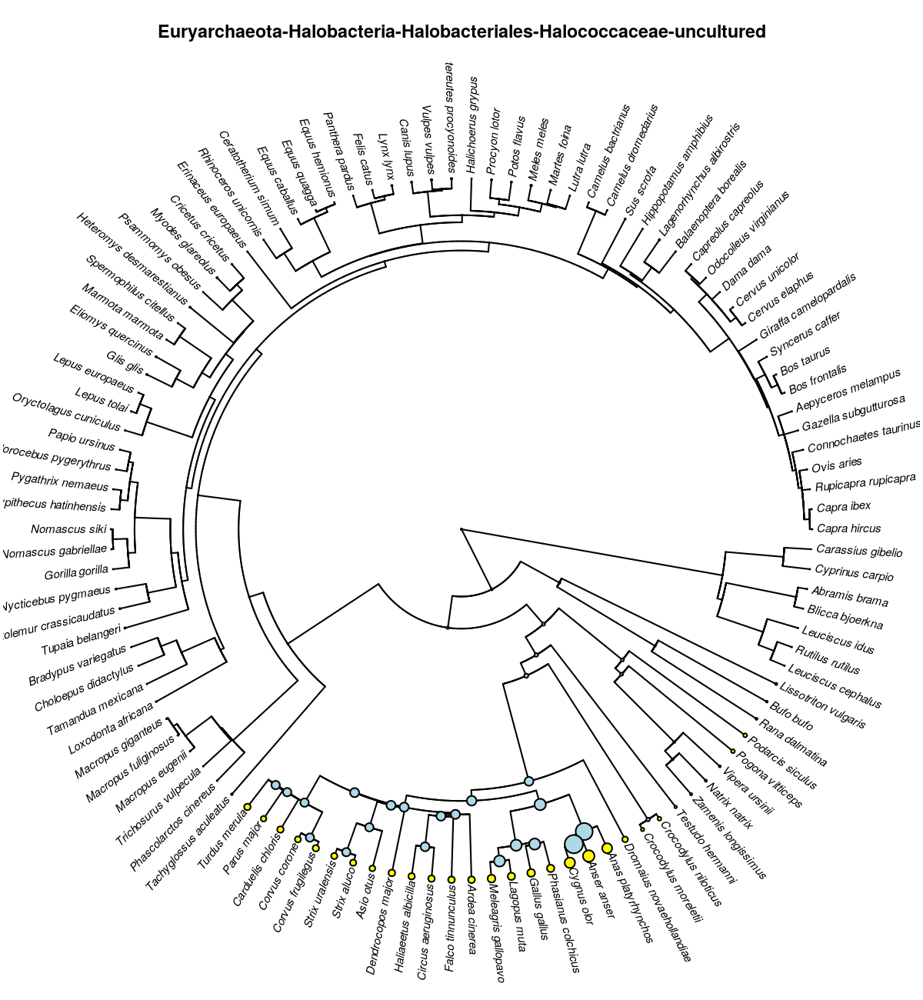

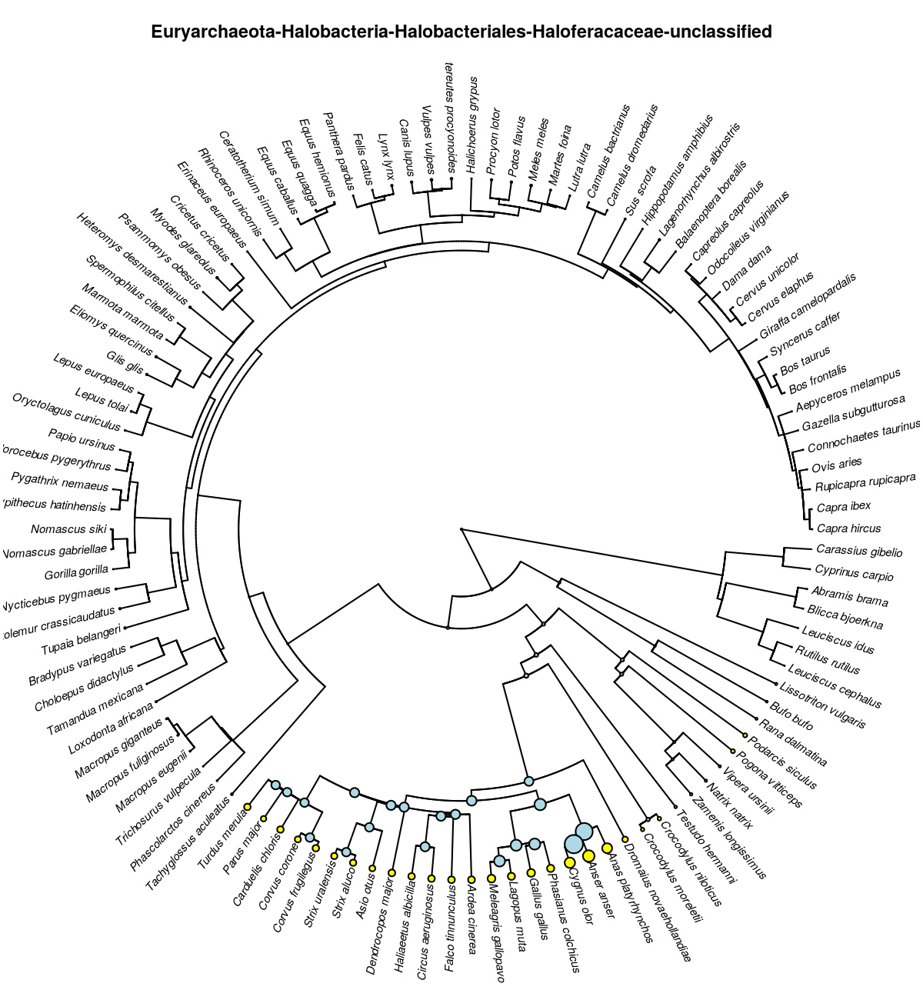

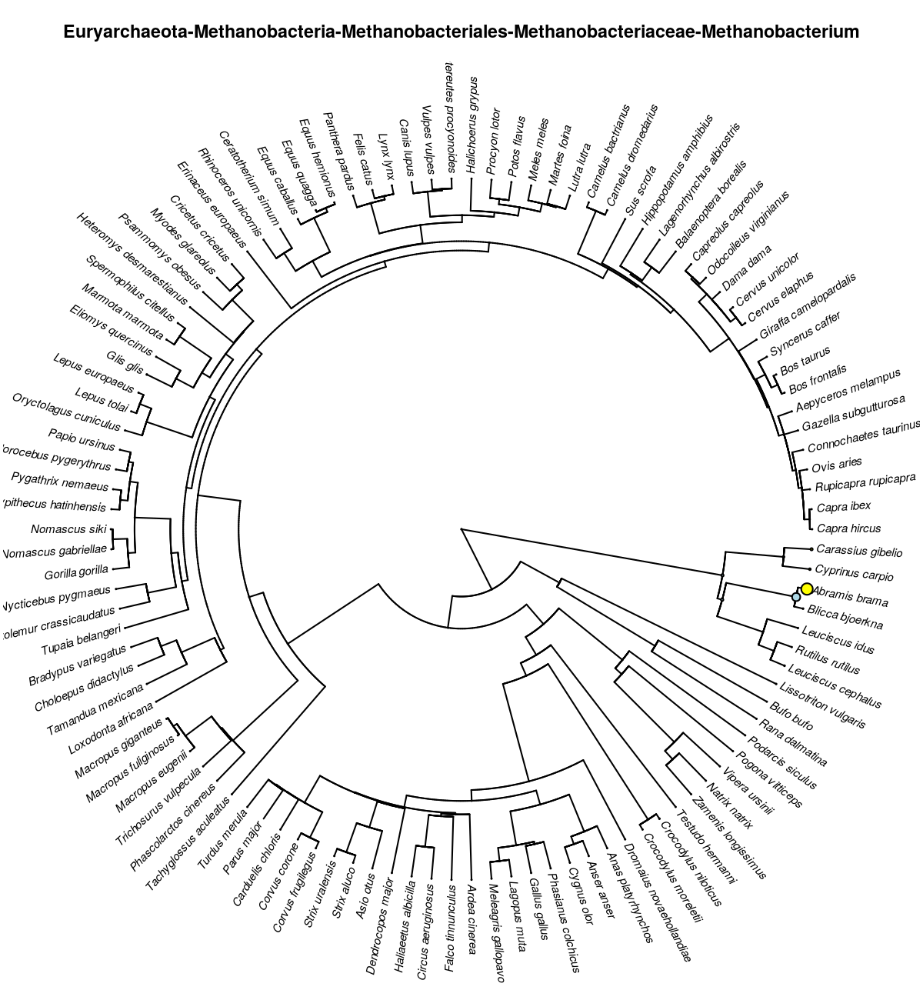

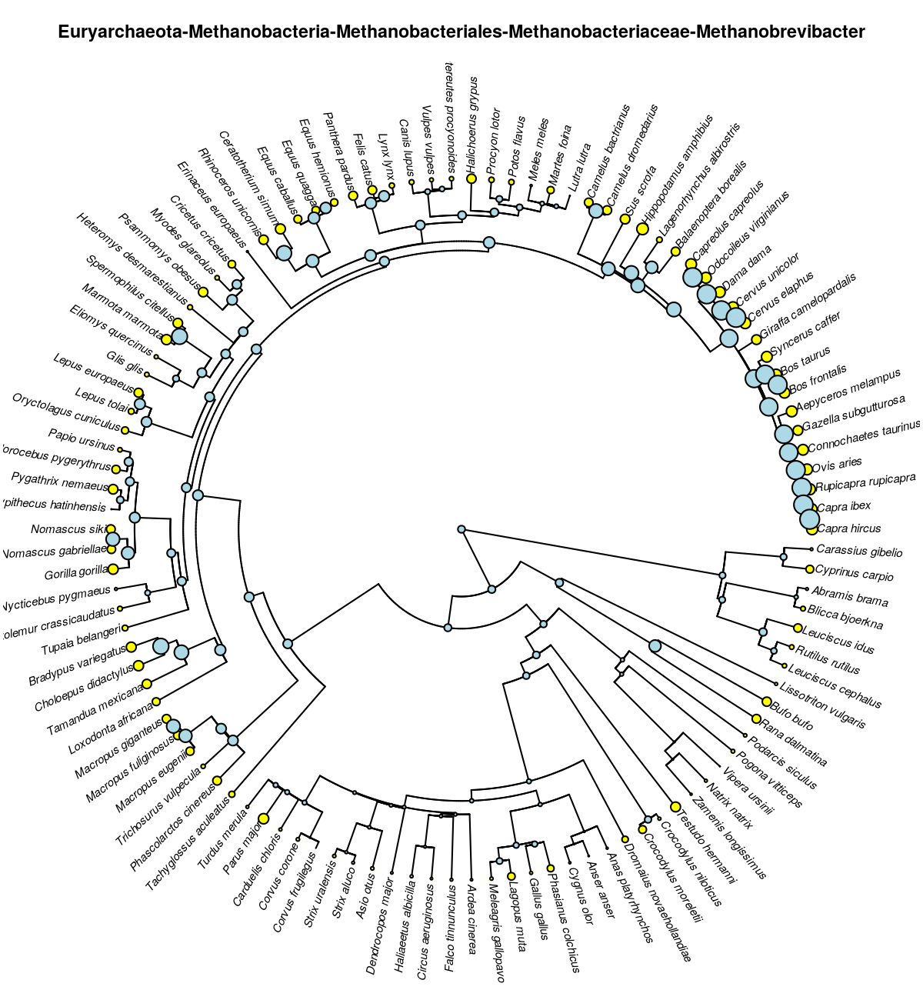

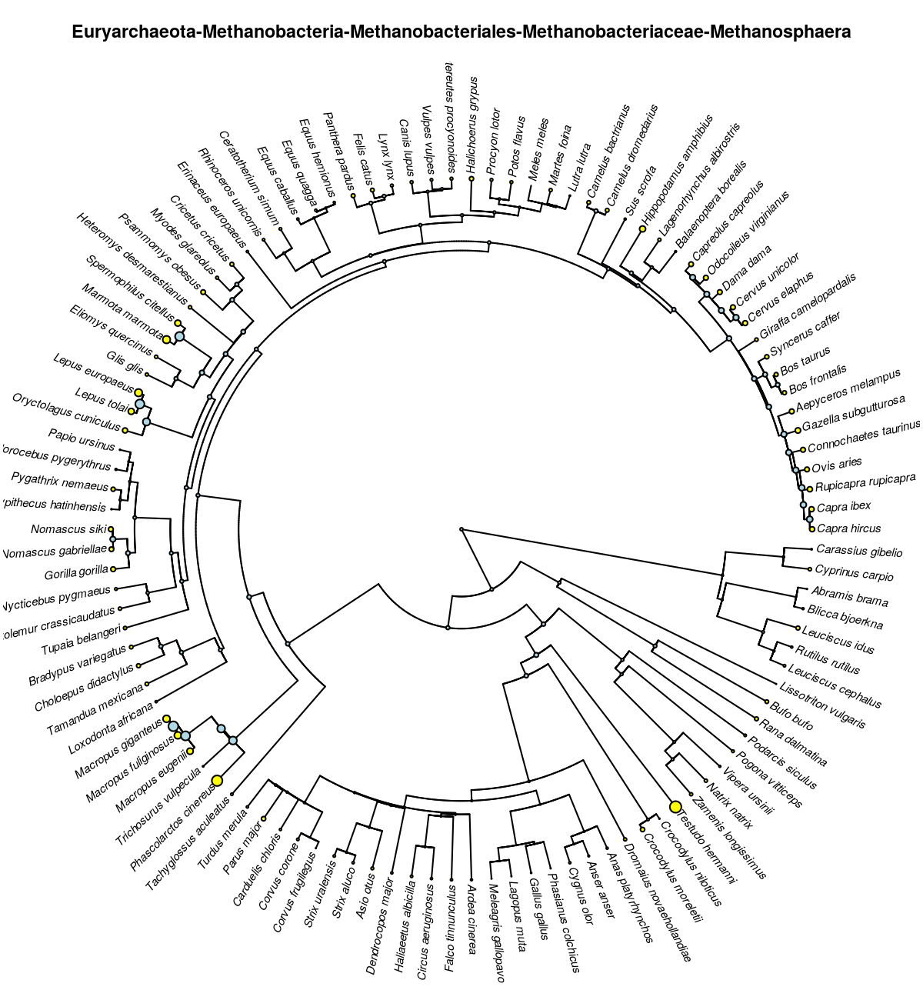

...

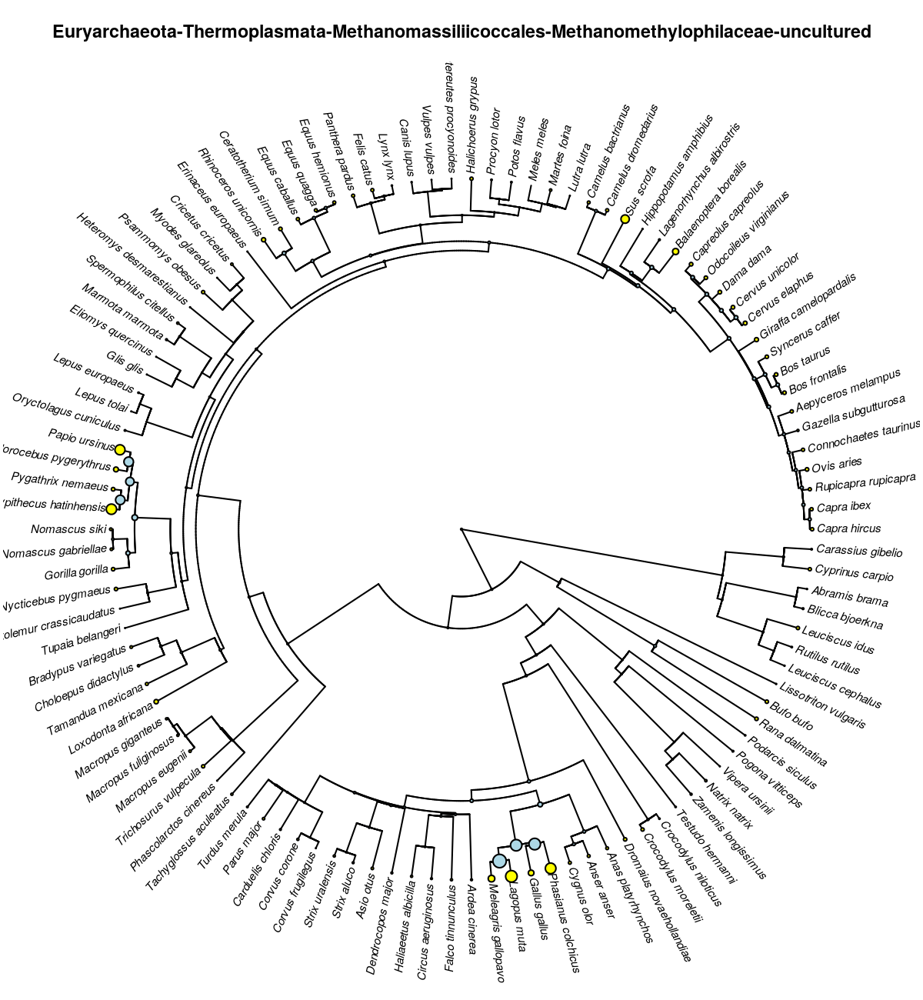

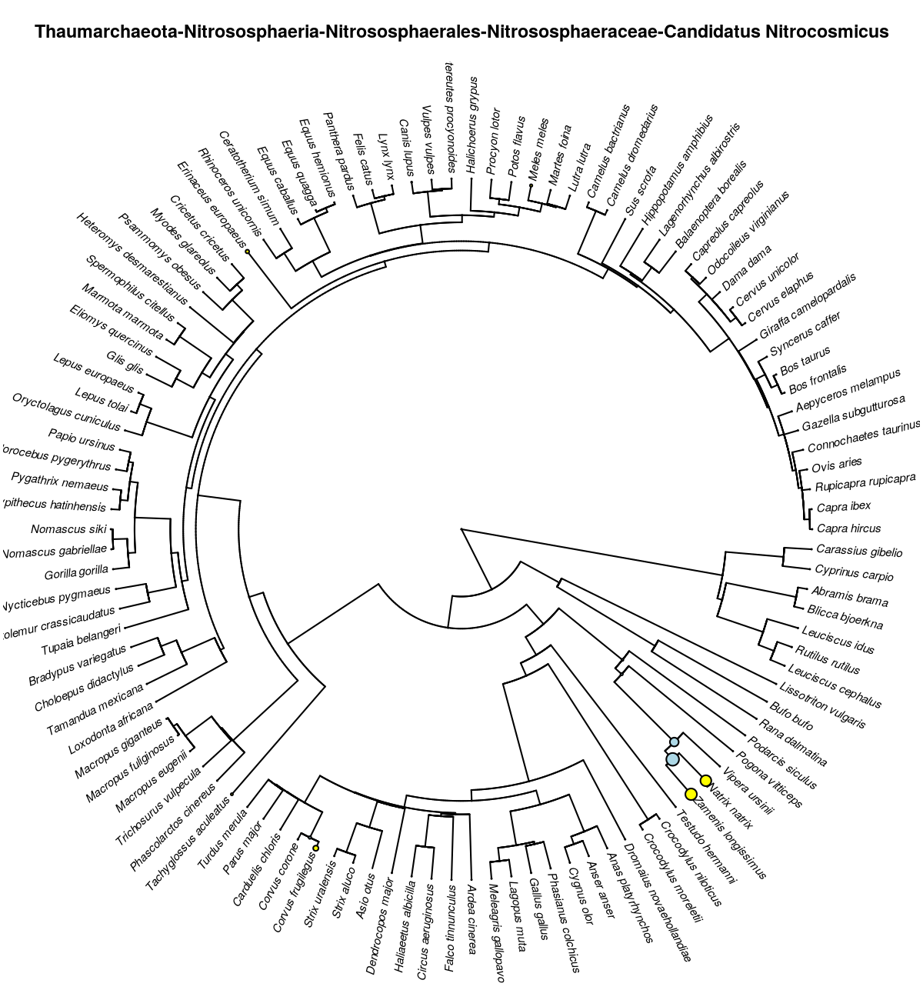

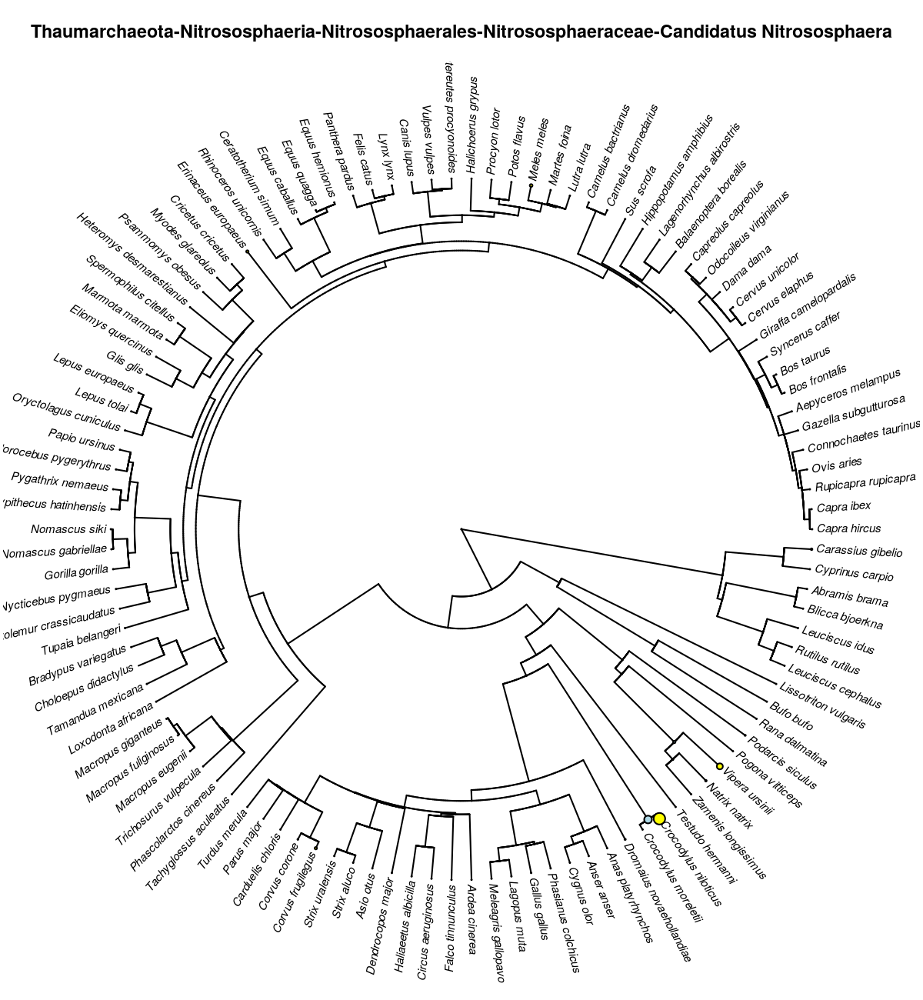

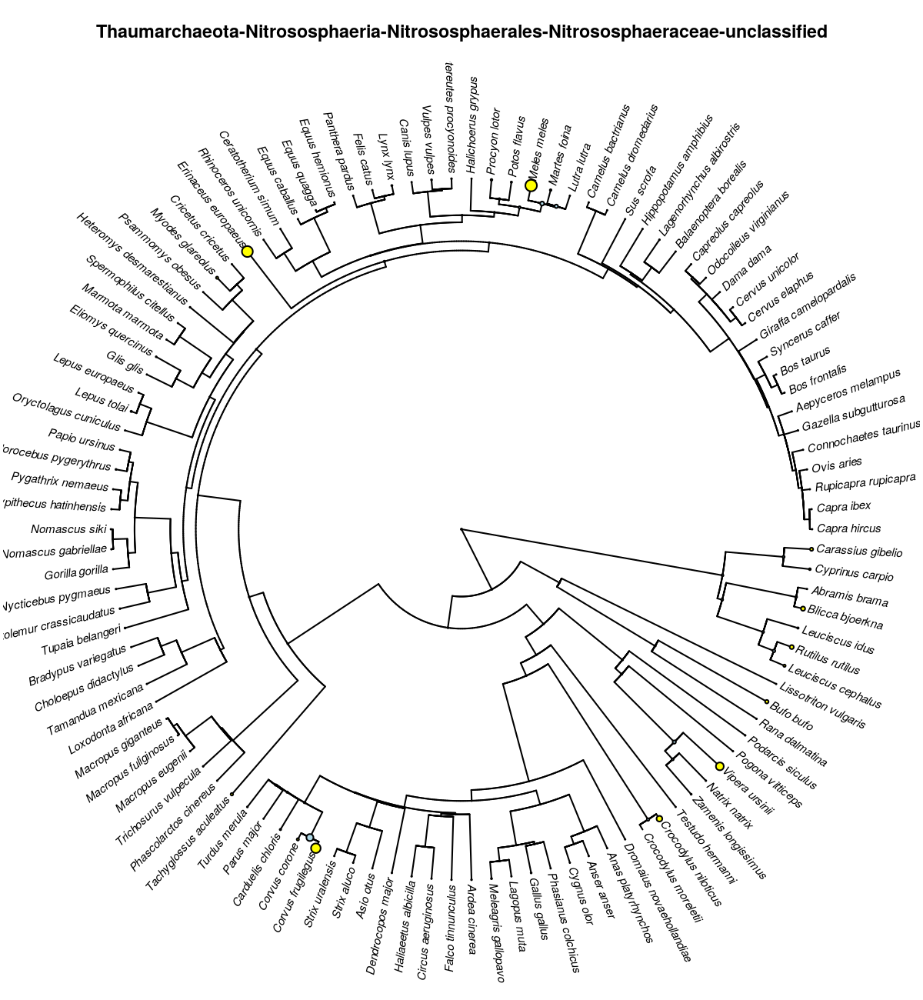

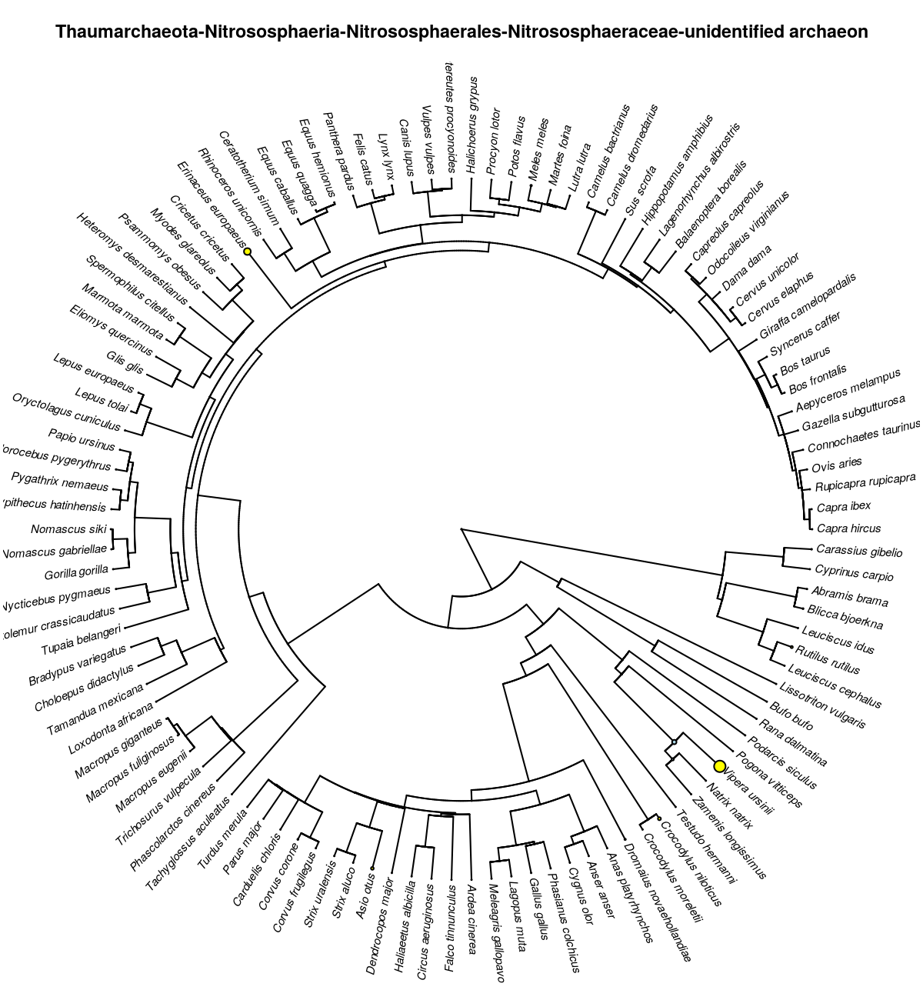

In [30]:
# plotting
taxa = colnames(asr)
ret = 1:length(taxa) %>%
    lapply(plot_tree, tree=tree, taxa=taxa, asr=asr)

# Phylogenetic signal

In [ ]:
# Pagel's lambda
p_lambda = phylopars(trait_data = otu,
                     tree = host_tree_SpecD,
                     model = 'lambda')
p_lambda %>% names

In [ ]:
# star phylogeny
p_star = phylopars(trait_data = otu,
                   tree = host_tree_SpecD,
                   model = 'star')
p_star %>% names

In [ ]:
# testing for significance (global phylogenetic signal for all traits)
chi_square = as.double(2*(logLik(p_lambda) - logLik(p_star))) 
degrees_freedom = p_lambda$npars - p_star$npars 
p_val = pchisq(q = chi_square, 
               df = degrees_freedom, 
               lower.tail = FALSE) 
p_val

## Per trait

In [ ]:
phy_signal = function(i, trt, tree){
    trt = trt[c(1,i+1)]
    # Pagel's lambda
    p_lambda = phylopars(trait_data = trt,
                         tree = tree,
                         model = 'lambda')
    # star phylogeny
    p_star = phylopars(trait_data = trt,
                       tree = tree,
                       model = 'star')
    # p-value
    chi_square = as.double(2*(logLik(p_lambda) - logLik(p_star))) 
    degrees_freedom = p_lambda$npars - p_star$npars 
    p_val = pchisq(q = chi_square, 
                   df = degrees_freedom, 
                   lower.tail = FALSE) 
    # return
    trt = colnames(trt)[ncol(trt)]
    return(c(trt, p_val))
}

# running in parallel
doParallel::registerDoParallel(threads)
phy_sig = 1:(ncol(otu)-1) %>%
    plyr::llply(phy_signal, trt=otu, tree=host_tree_SpecD, .parallel=TRUE) %>%
    do.call(rbind, .) %>%
    as.data.frame
colnames(phy_sig) = c('Trait', 'p_value')
phy_sig

In [ ]:
# formatting
phy_sig = phy_sig %>%
    as_tibble %>%
    mutate(p_value = p_value %>% as.Num,
           q_value = p.adjust(p_value, method='BH'),
           sig = q_value < 0.05) 

df.dims(10)
phy_sig %>% arrange(q_value)
df.dims()

In [ ]:
# plotting
p = phy_sig %>%
    mutate(Trait = gsub('-', ';', Trait),
           Trait = Trait %>% reorder(-q_value)) %>%
    ggplot(aes(Trait, q_value, color=sig)) +
    geom_hline(yintercept = 0.05, linetype='dashed', alpha=0.3) +
    geom_point() +
    scale_y_log10() +
    scale_color_discrete('Adj. P < 0.05') +
    labs(x='Class', y='Adj. P') +
    theme_bw() +
    coord_flip()

p.dims(5,3)
plot(p)

# sessionInfo

In [ ]:
sessionInfo()